In [78]:
import os
import glob
import re
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import shutil
import random
%matplotlib inline

### configure your aws credentials to get writerights on S3

In [79]:
home = os.getcwd().split('AUT-CNN-TUB')[0]

# Image centering

In [80]:
def get_all_images_from_part(read_path, partname, extension):

    numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
    pats_path = [x.string for x in numbers if x is not None]

    if pats_path == []:
        print('ERROR: no directories in path or wrong naming')
        SystemExit
        
    if partname not in pats_path:
        if type(partname) is str:
            print("ERROR: directory for this partnumber doesn't exist" )
            SystemExit
        else:
            partname = str(partname)
            
            if partname not in pats_path:
                print("ERROR: directory for this partnumber doesn't exist")
                SystemExit
                
    if extension  not in ['gif', 'jpeg', 'jpg', 'png', 'JPG']:
        print('ERROR: unknown extension, ', extension)
        SystemExit
        
    else:
        data_path = os.path.join(os.path.join(read_path, partname), '*{}'.format(extension))
        files = glob.glob(data_path)
        return files

In [81]:
#read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_industry/')
#read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_canon/')
#read_path = '/home/jeronimo/git/AUT-CNN-TUB/Data/Raw_Data_27072018_industry/'
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/aug/')

In [82]:
numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
[x.string for x in numbers if x is not None]

['2', '13', '14', '1', '7.1', '8', '5', '4', '3', '10', '12', '11', '6']

In [83]:
files = get_all_images_from_part(read_path, 2, 'jpg')# jpg, JPG

In [84]:
for z,i in enumerate(files):
    if '02.0.2.3.4151_aug_32' in i:
        print(i, z)

In [85]:
file_path = files[2]
img_name = file_path.split('/')[-1]  
image = cv2.imread(file_path)

### original

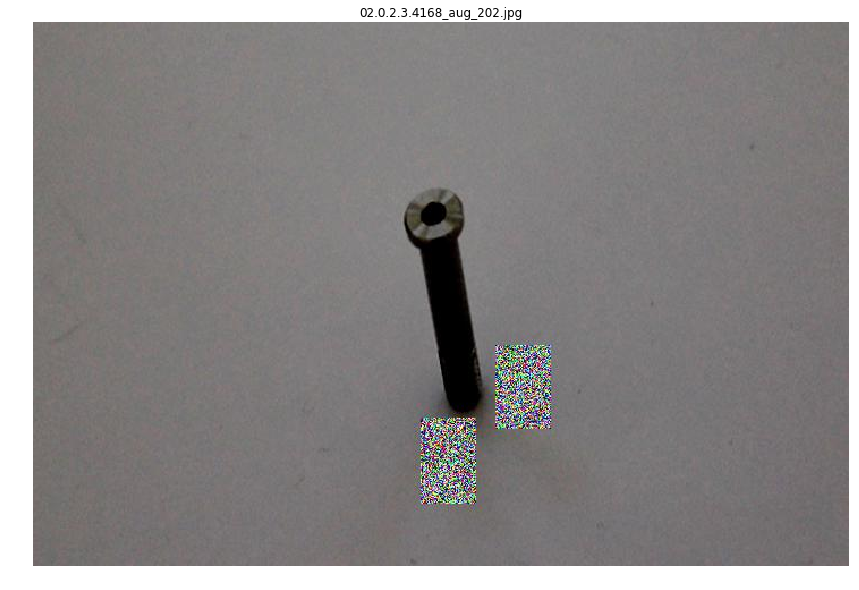

In [86]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(1, 1, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

### grayscale

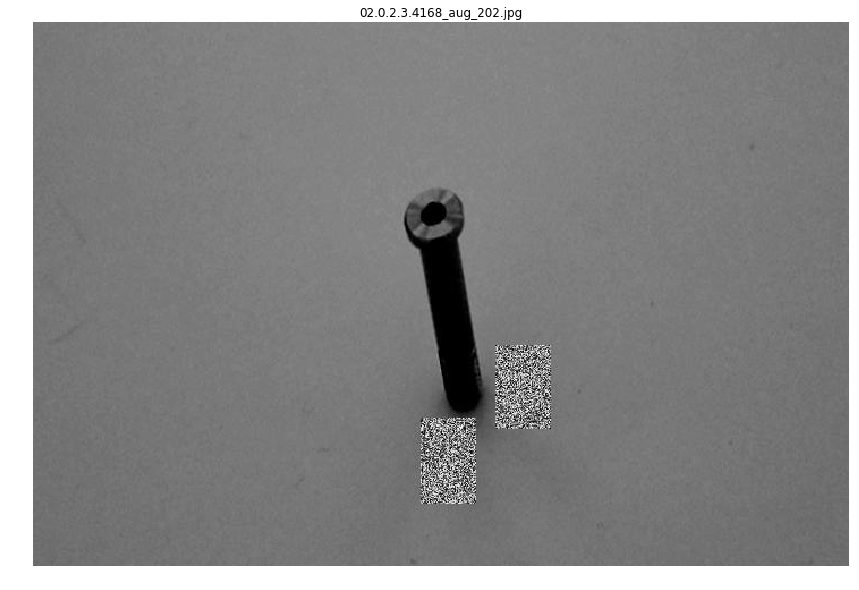

In [87]:
imgray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(1, 1, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(imgray, cmap='gray');
plt.show()

In [88]:
form_factor = imgray.shape[1]/1280
brightness = imgray.mean()

In [89]:
imgray.max()

255

In [90]:
imgray.min()

0

In [91]:
imgray.mean()

119.79478298611112

In [92]:
imgray.var()

378.54820715776606

In [93]:
brightness

119.79478298611112

In [94]:
form_factor

0.5625

### blurred

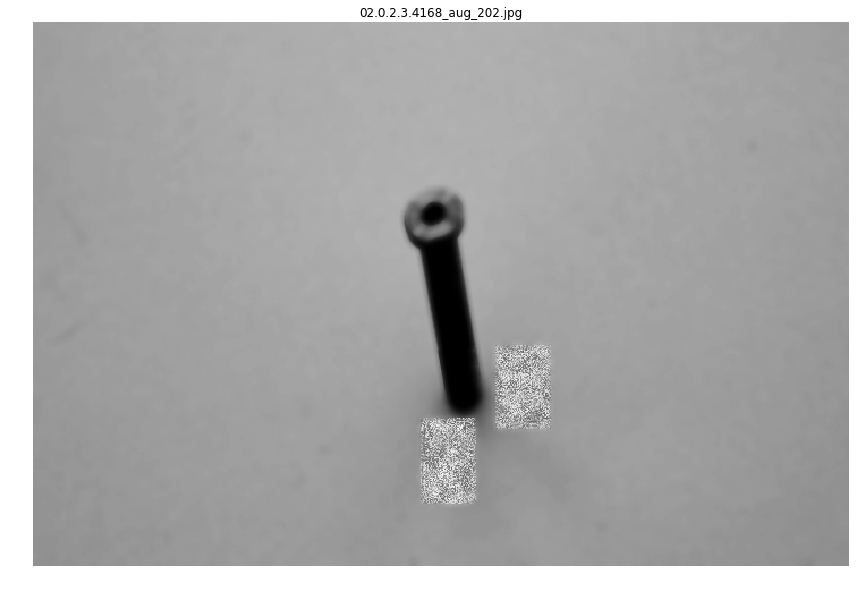

In [95]:
blurred = cv2.bilateralFilter(imgray,10, 50 / form_factor, 50 / form_factor)

fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(1, 1, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(blurred,  cmap='gray')
plt.show()

In [96]:
10 / form_factor

17.77777777777778

In [97]:
brightness / form_factor

212.96850308641976

# edge detection

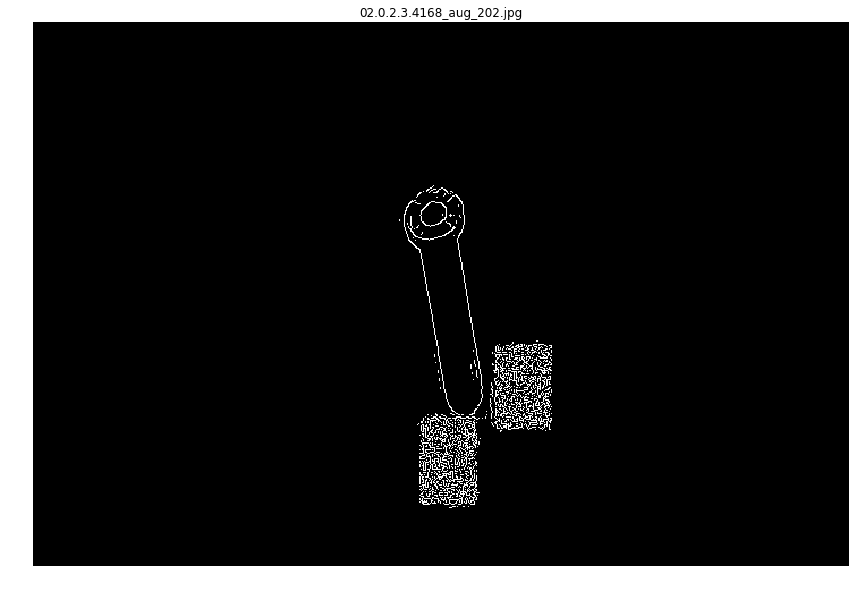

In [98]:
thresh = cv2.Canny(blurred, brightness/4 , brightness/4 )

fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(1, 1, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(thresh, cmap='gray');
plt.show()

# dilation

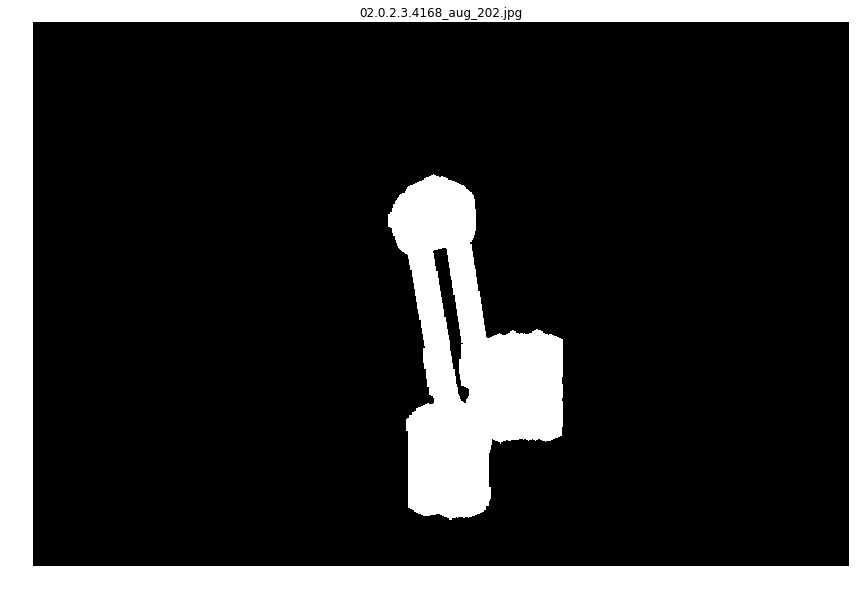

In [99]:
kernel =  cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
dilation = cv2.dilate(thresh,kernel,iterations = 5)

fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(1, 1, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(dilation, cmap='gray');
plt.show()

# get outer Contour

In [100]:
to_drop = []

_,contours,_ = cv2.findContours(dilation,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

for e,c in enumerate(contours):
    for n,test in enumerate(contours):
        if n!= e:
            if c[:,:,0].max() < test[:,:,0].max():
                if c[:,:,0].min()  >  test[:,:,0].min():
                    if c[:,:,1].max() < test[:,:,1].max():
                        if c[:,:,1].min() > test[:,:,1].min():
                                to_drop.append(e)
if to_drop!= []:
    sub_con = np.delete(contours, to_drop).tolist()
else:
    sub_con = contours

In [101]:
len(contours)

2

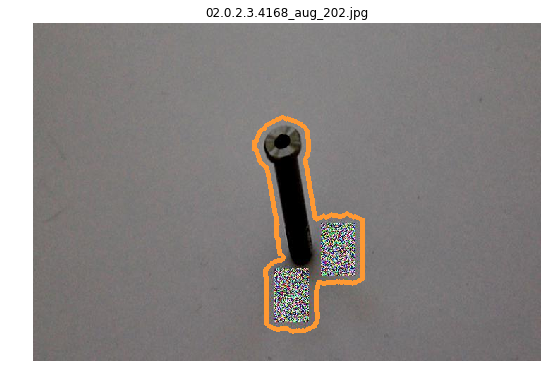

In [102]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(1, 2, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(cv2.drawContours(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), contours, 0, (255, 153, 51), 5));
plt.show()

# get max contourArea

In [103]:
c = max(contours, key = cv2.contourArea)

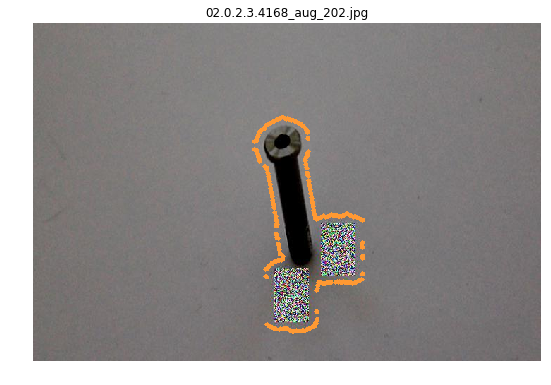

In [104]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(1, 2, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(cv2.drawContours(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), c, -3, (255, 153, 51), 5));
plt.show()

### fit in circle, to know where to cut

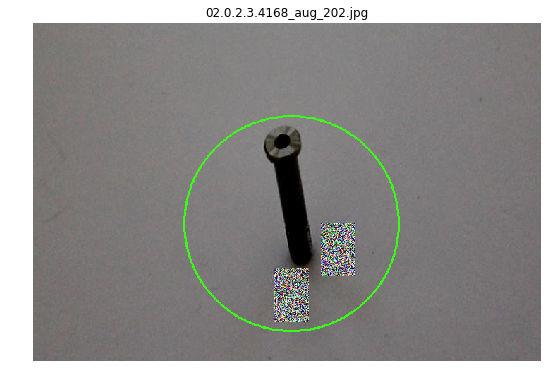

In [105]:
(x,y),radius = cv2.minEnclosingCircle(c)
center = (int(x),int(y))
radius = int(radius)
img = cv2.circle(cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
                 center,
                 radius,
                 (57, 255,20),2)

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(1, 2, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(img)
plt.show()

# cutted and scaled image

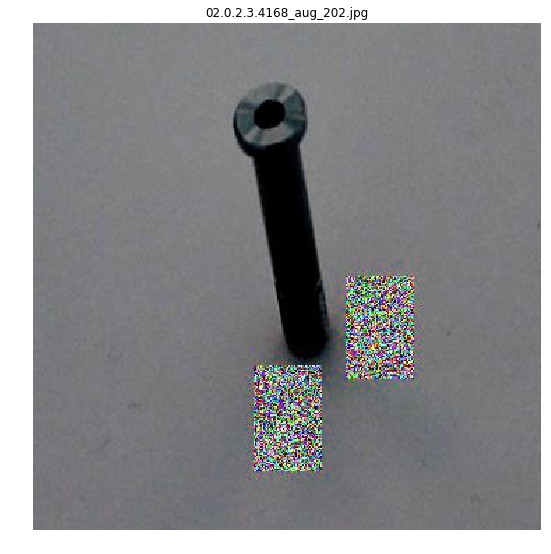

In [106]:
scale = 1.2
scaled_rad = int(radius * scale)
try:
    img_cutted = image[center[1] - scaled_rad : center[1] + scaled_rad,
                       center[0] - scaled_rad : center[0] + scaled_rad,
                       : ] 
except:
    img_cutted = image[center[1] - radius : center[1] + radius,
                       center[0] - radius : center[0] + radius,
                       : ] 
    
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(1, 2, 1)
ax1.axis('off')
ax1.set_title(file_path.split('/')[-1])
ax1.imshow(img_cutted)
plt.show()

In [107]:
img_cutted.var()

944.6871780313722

In [108]:
def get_part_from_image(image, scale = 1.1):
    
    imgray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    brightness = imgray.mean()
    blurred = cv2.bilateralFilter(imgray, 10, brightness / form_factor, brightness / form_factor)
    thresh = cv2.Canny(blurred, brightness / 4 , brightness / 4 )
    
    kernel =  cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    dilation = cv2.dilate(thresh,kernel,iterations = 5)
    
    _,contours,_ = cv2.findContours(dilation,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    c = max(contours, key = cv2.contourArea)

    (x,y),radius = cv2.minEnclosingCircle(c)
    center = (int(x),int(y))
    radius = int(radius)

    scaled_rad = int(radius * scale)
    try:
        img_cutted = image[center[1] - scaled_rad : center[1] + scaled_rad,
                           center[0] - scaled_rad : center[0] + scaled_rad,
                           : ] 
    except:
        img_cutted = image[center[1] - radius : center[1] + radius,
                           center[0] - radius : center[0] + radius,
                           : ] 

    return img_cutted


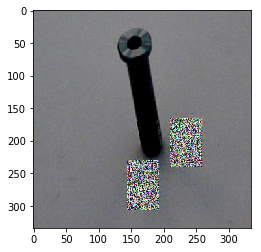

In [109]:
plt.imshow(get_part_from_image(image, scale = 1.1))
plt.show()

0 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_184.jpg
1363.133045774625


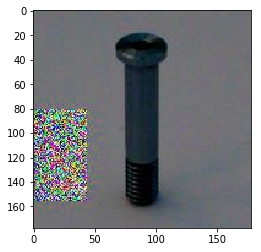

1 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4106_aug_135.jpg
667.6410443012312


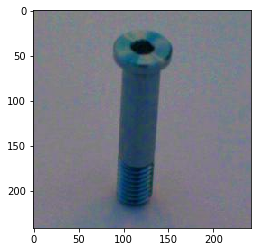

2 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4168_aug_202.jpg
1107.3962383798462


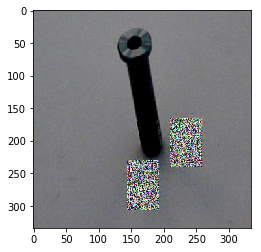

3 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4112_aug_10.jpg
877.9106214833739


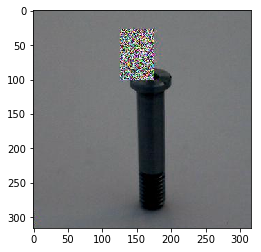

4 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4074_aug_209.jpg
2439.872967484626


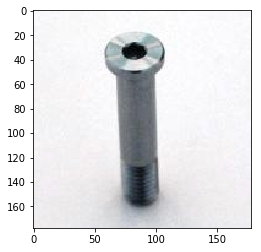

5 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4163_aug_111.jpg
779.7631398273306


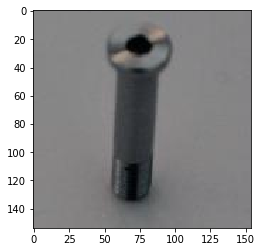

6 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4078_aug_238.jpg
4691.972167229806


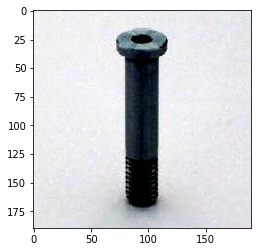

7 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4162_aug_173.jpg
634.5025160857911


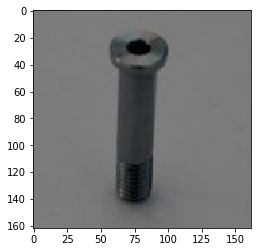

8 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4142_aug_267.jpg
1028.1659851674638


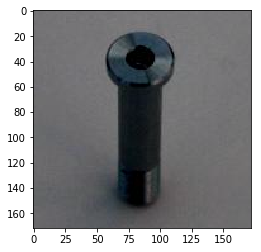

9 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3664_aug_65.jpg
625.76106460048


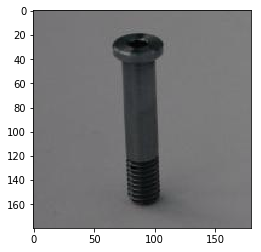

10 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3605_aug_58.jpg
4187.301221390219


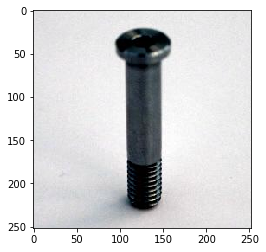

11 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4150_aug_158.jpg
494.65285625557914


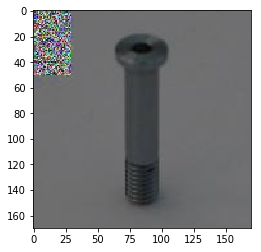

12 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_207.jpg
652.1519862152048


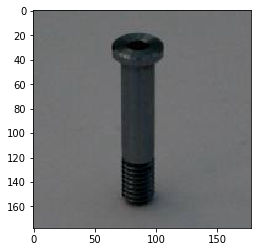

13 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4147_aug_92.jpg
338.590989182913


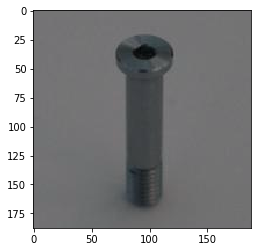

14 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3668_aug_250.jpg
1206.926162771089


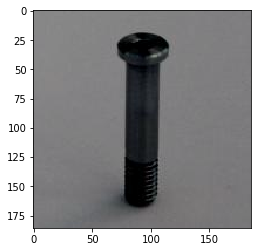

15 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3607_aug_164.jpg
1460.5319011339984


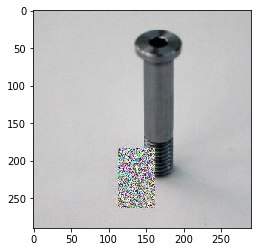

16 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4152_aug_14.jpg
426.4636444826424


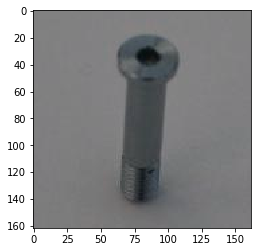

17 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4111_aug_6.jpg
2171.3816085112435


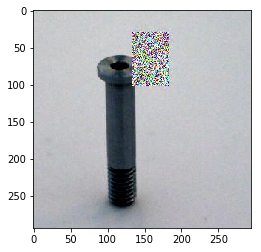

18 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4170_aug_187.jpg
4419.520503336292


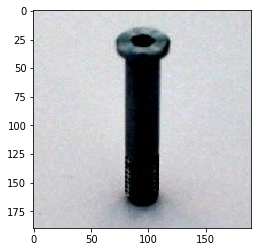

19 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4171_aug_191.jpg
3300.0028669458366


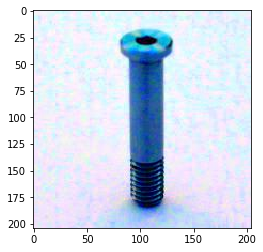

20 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4066_aug_109.jpg
1476.6107158781333


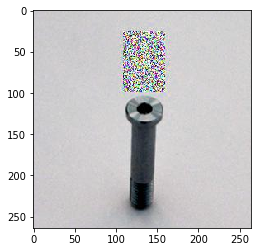

21 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4064_aug_42.jpg
2140.186445919354


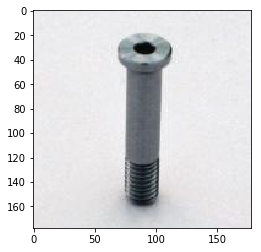

22 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4080_aug_98.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4080_aug_98.jpg
23 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4145_aug_162.jpg
443.1621584427798


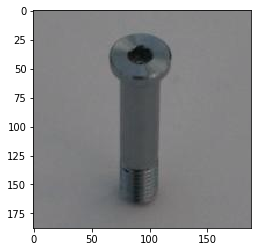

24 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4117_aug_258.jpg
1489.8429065565406


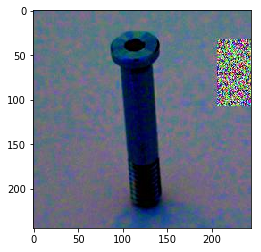

25 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_233.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_233.jpg
26 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_262.jpg
737.9704017402591


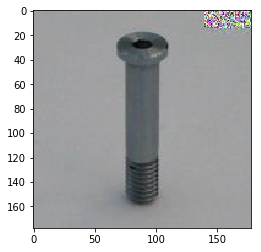

27 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4111_aug_78.jpg
428.2157213571516


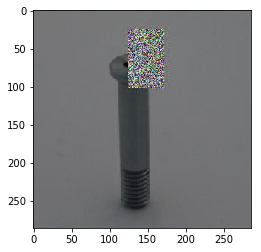

28 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4118_aug_155.jpg
1851.9998395200153


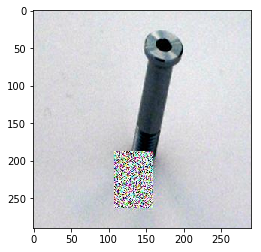

29 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4075_aug_34.jpg
2107.5879577076016


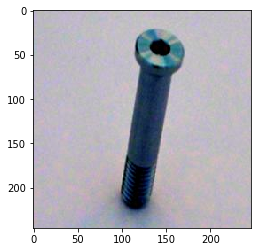

30 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4107_aug_57.jpg
522.7155100736734


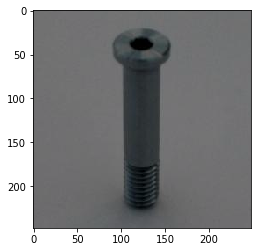

31 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4118_aug_125.jpg
596.1940966959089


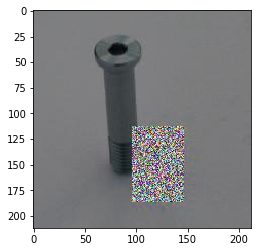

32 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4140_aug_263.jpg
1421.0443018529315


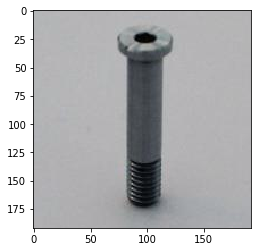

33 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3668_aug_8.jpg
679.7328814249282


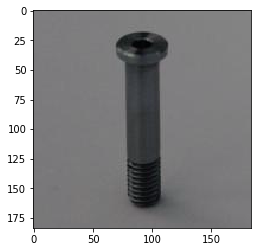

34 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3684_aug_70.jpg
957.21810090515


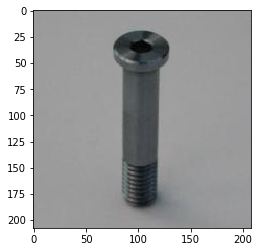

35 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4083_aug_186.jpg
785.0116345597066


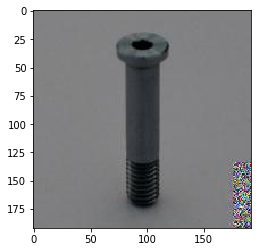

36 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3668_aug_61.jpg
1142.7403597181224


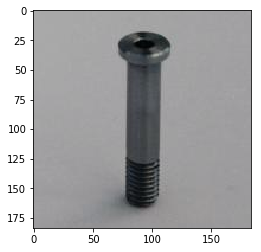

37 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4124_aug_194.jpg
540.5287211713525


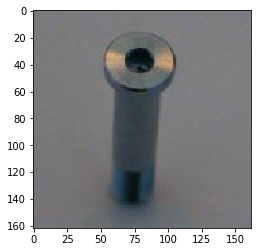

38 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_244.jpg
842.0222028014952


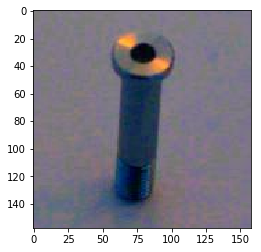

39 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4077_aug_221.jpg
984.6348190555794


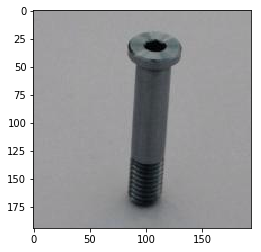

40 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4090_aug_110.jpg
812.6627693880546


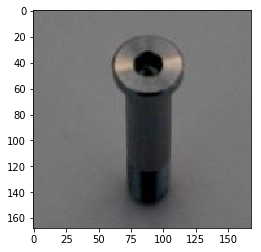

41 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4142_aug_123.jpg
951.9677929844627


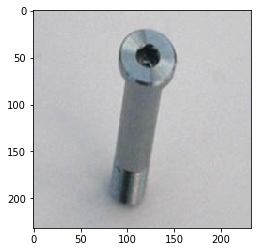

42 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4097_aug_75.jpg
1236.6693831794307


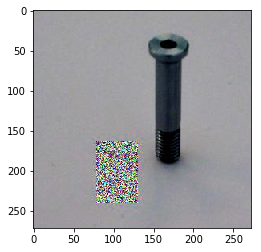

43 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4164_aug_240.jpg
874.2554962837513


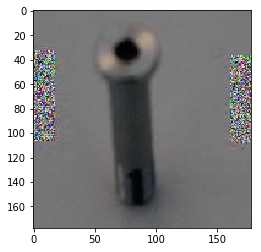

44 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3607_aug_204.jpg
2449.6379401348104


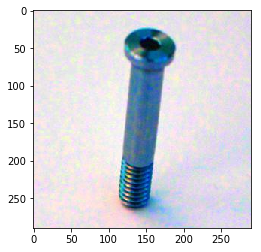

45 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4099_aug_128.jpg
1114.9893939324181


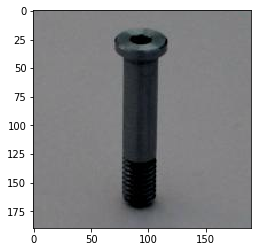

46 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4134_aug_192.jpg
1413.6168107360825


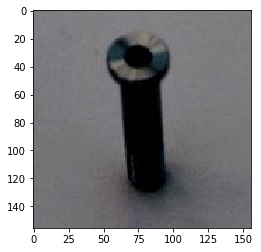

47 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_239.jpg
499.355101134099


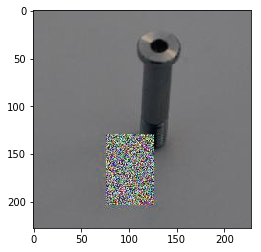

48 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_129.jpg
3181.892379827177


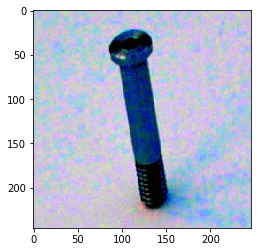

49 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_160.jpg
638.6743516924498


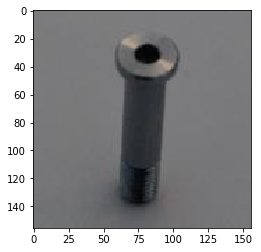

50 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4070_aug_222.jpg
822.773131020247


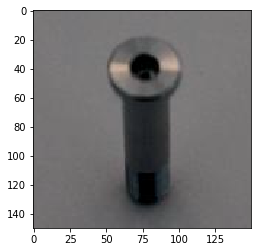

51 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4165_aug_5.jpg
1294.7512190833238


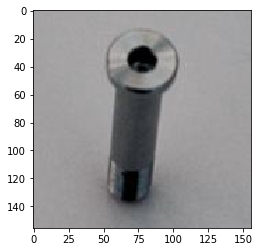

52 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_15.jpg
727.6458763504938


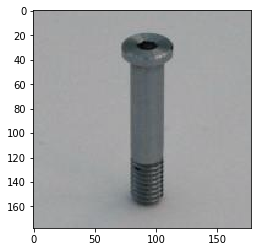

53 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4168_aug_28.jpg
1676.6746827105453


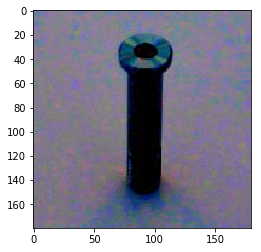

54 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4170_aug_235.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4170_aug_235.jpg
55 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4099_aug_148.jpg
2937.1771260168


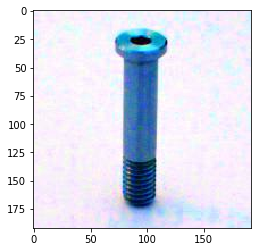

56 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4099_aug_147.jpg
1238.6550092010852


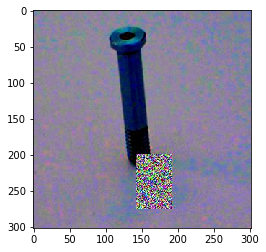

57 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4170_aug_82.jpg
737.2466130098851


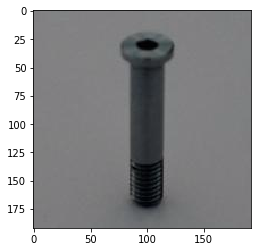

58 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4115_aug_245.jpg
495.80997557599954


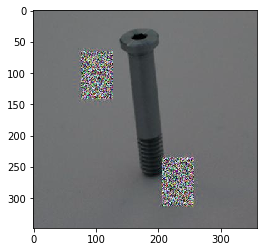

59 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4113_aug_24.jpg
603.15016377152


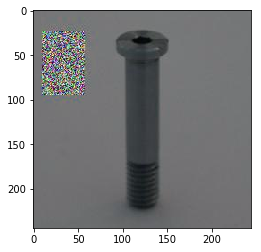

60 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3666_aug_211.jpg
1047.5492662222223


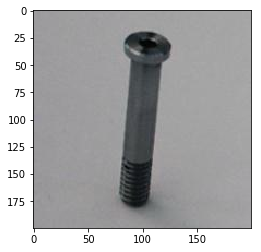

61 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4107_aug_150.jpg
2905.4485769614043


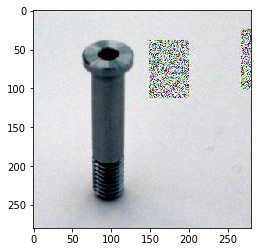

62 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4068_aug_146.jpg
1109.060013812728


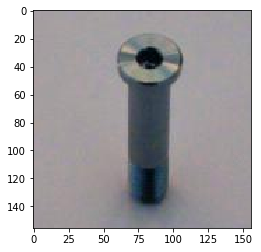

63 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3684_aug_249.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3684_aug_249.jpg
64 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4121_aug_90.jpg
436.75050711097964


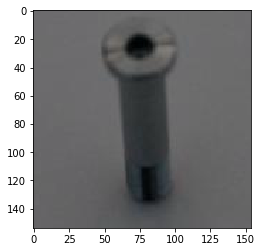

65 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4132_aug_18.jpg
427.08532358416625


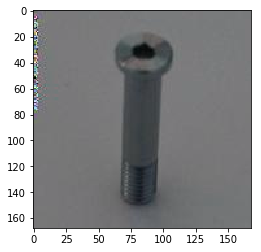

66 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3681_aug_40.jpg
1125.1905650565445


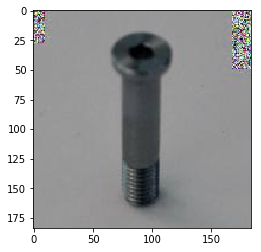

67 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4089_aug_48.jpg
810.7299823356436


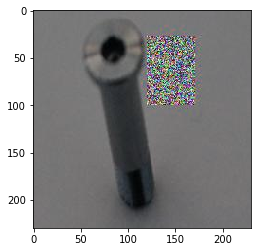

68 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4145_aug_236.jpg
1006.2201529486222


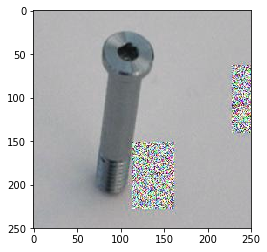

69 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4161_aug_169.jpg
3392.4288307964734


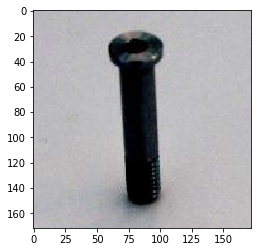

70 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4166_aug_210.jpg
3527.2430651585623


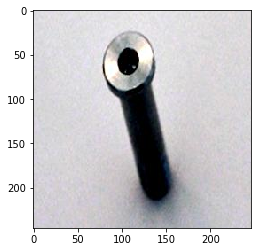

71 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4065_aug_117.jpg
1501.495102528699


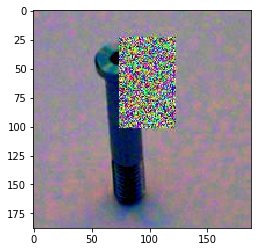

72 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4062_aug_226.jpg
1397.501567121597


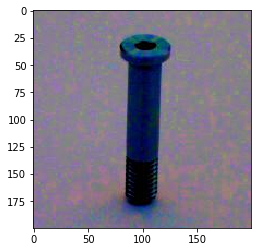

73 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4160_aug_33.jpg
1388.3570246904055


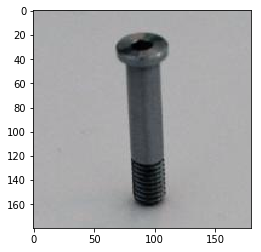

74 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_181.jpg
2414.4257628562723


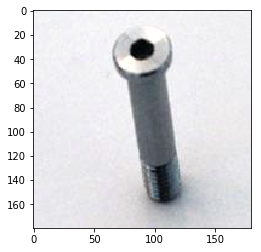

75 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4081_aug_9.jpg
675.3295680827084


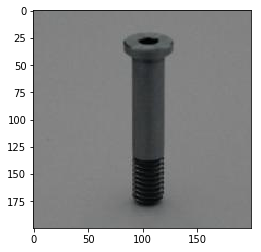

76 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4094_aug_247.jpg
2832.4423118944983


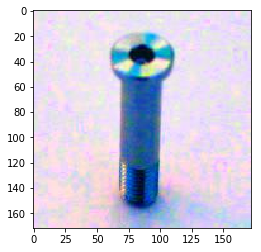

77 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4110_aug_214.jpg
3268.956168423652


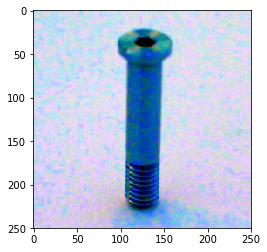

78 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4171_aug_180.jpg
1034.2899870415217


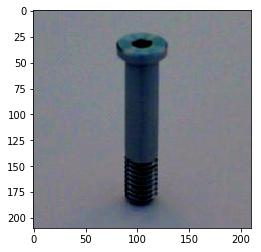

79 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3665_aug_183.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3665_aug_183.jpg
80 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4128_aug_54.jpg
1164.153120316841


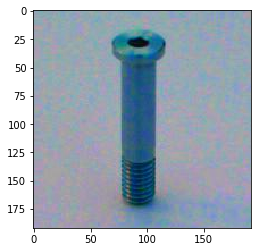

81 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_254.jpg
1179.3525445529135


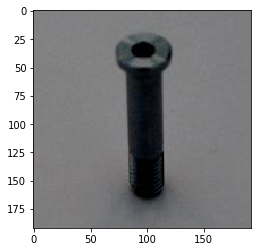

82 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4097_aug_227.jpg
2062.467132151042


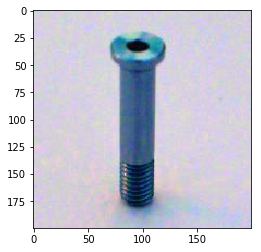

83 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4095_aug_19.jpg
1087.6376516908012


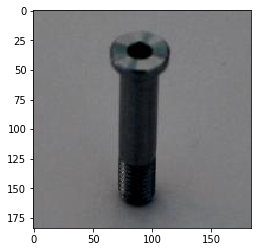

84 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4155_aug_172.jpg
576.2216748439072


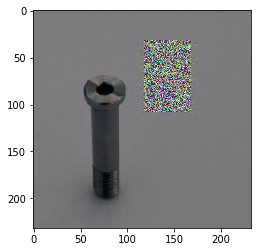

85 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4154_aug_32.jpg
3934.337723042636


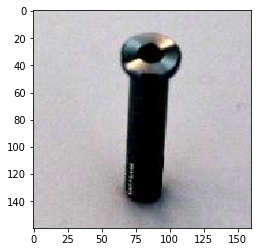

86 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4089_aug_143.jpg
908.2319299170534


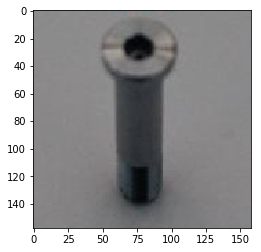

87 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4147_aug_176.jpg
1218.5414130925003


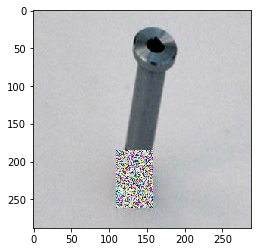

88 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4112_aug_139.jpg
1450.2915257790858


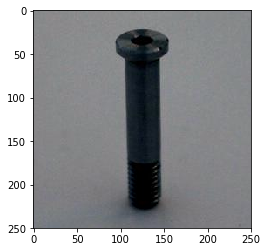

89 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4142_aug_255.jpg
343.8141651449867


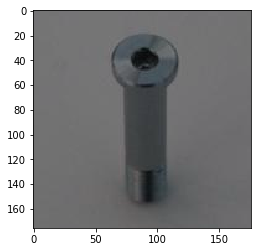

90 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4127_aug_223.jpg
3283.064887295899


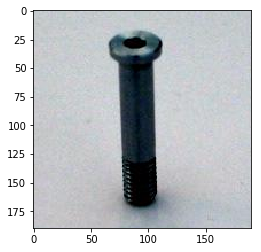

91 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4067_aug_16.jpg
1131.6088872635967


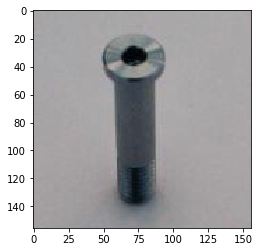

92 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4101_aug_168.jpg
819.8435742662139


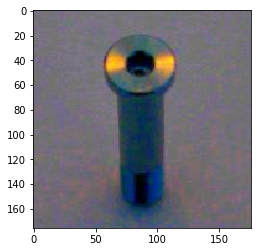

93 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3665_aug_182.jpg
1947.9320273889412


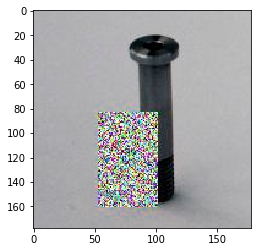

94 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4139_aug_41.jpg
1107.113587203676


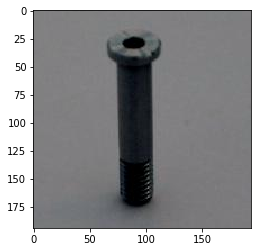

95 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4067_aug_66.jpg
1379.3136084145322


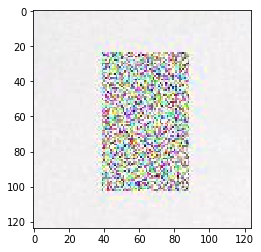

96 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4133_aug_167.jpg
861.9576124104742


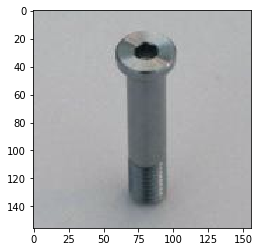

97 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3673_aug_64.jpg
1834.944720418657


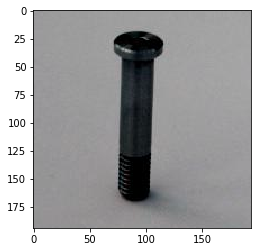

98 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4133_aug_242.jpg
864.1681634092039


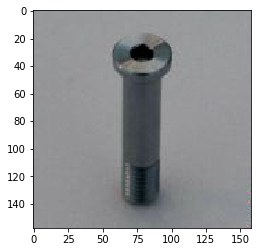

99 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4114_aug_37.jpg
411.5573225984615


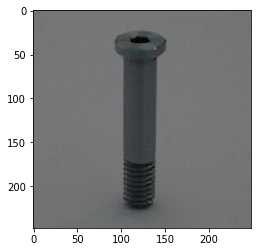

100 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4149_aug_23.jpg
2826.7001265177905


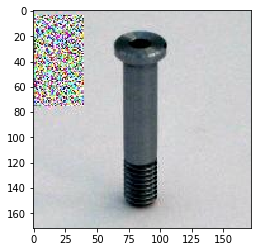

101 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4123_aug_189.jpg
813.2362865898596


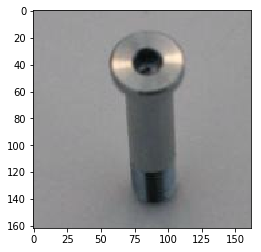

102 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4144_aug_122.jpg
292.5526888772148


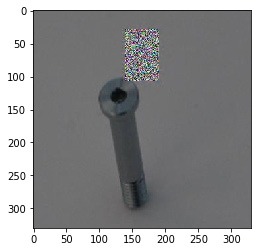

103 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4070_aug_127.jpg
2252.860897690243


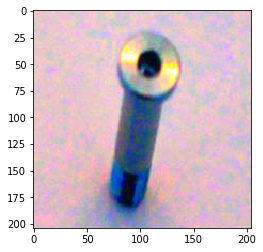

104 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3672_aug_198.jpg
5856.479874964571


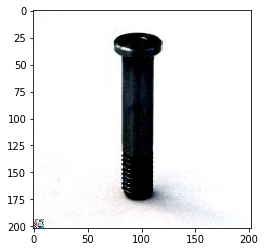

105 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4107_aug_141.jpg
800.8045749708635


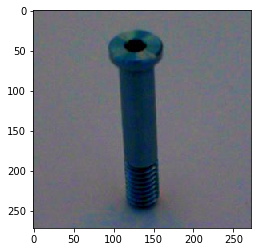

106 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4140_aug_206.jpg
1535.3560765609795


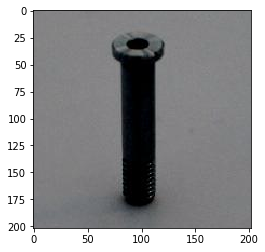

107 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4098_aug_114.jpg
663.405336388215


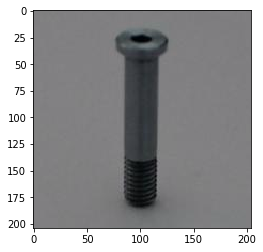

108 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4067_aug_97.jpg
1184.3392911699498


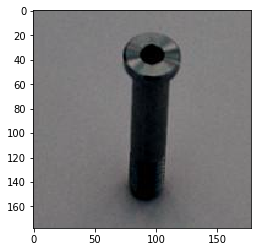

109 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4124_aug_179.jpg
300.72682317145814


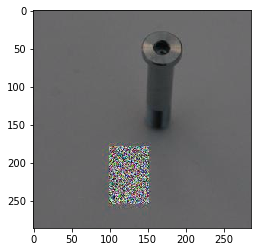

110 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4147_aug_266.jpg
619.7698128691576


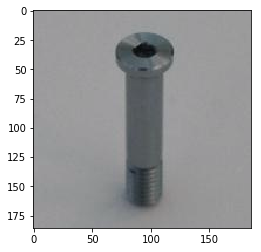

111 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4123_aug_228.jpg
405.0337716345113


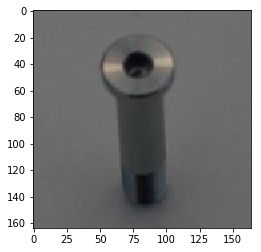

112 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4105_aug_72.jpg
1154.935952245775


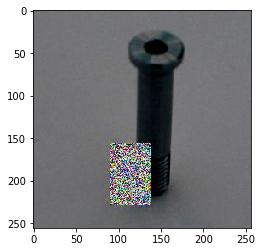

113 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4091_aug_177.jpg
3421.8800457068996


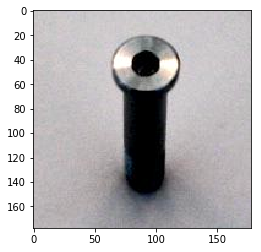

114 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4166_aug_25.jpg
2099.0588939883264


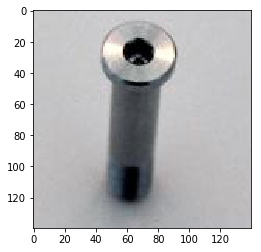

115 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4122_aug_113.jpg
353.51911502797054


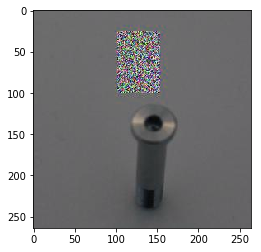

116 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4141_aug_199.jpg
1719.7854883756806


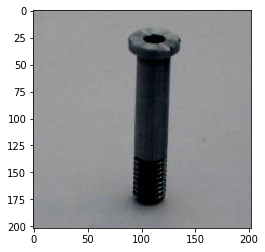

117 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3671_aug_156.jpg
808.4661643798369


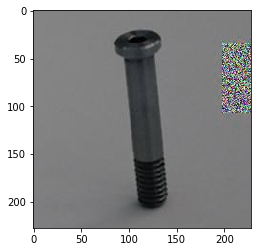

118 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4118_aug_217.jpg
796.3111337240533


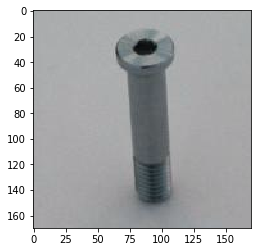

119 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4129_aug_140.jpg
674.1070119517033


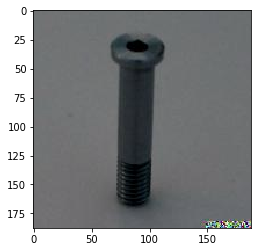

120 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4098_aug_265.jpg
1363.9374401611074


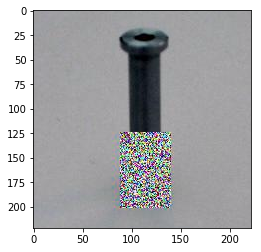

121 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4137_aug_264.jpg
1539.3847379775136


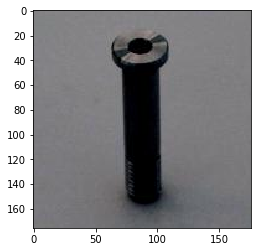

122 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3684_aug_76.jpg
597.8990384273463


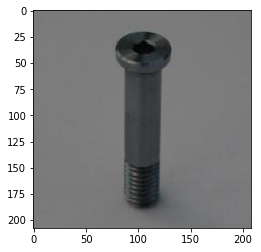

123 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4154_aug_29.jpg
2333.219366857394


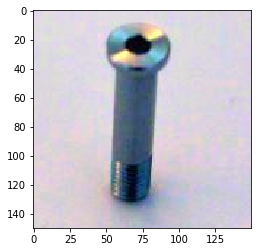

124 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4080_aug_252.jpg
3013.783504818142


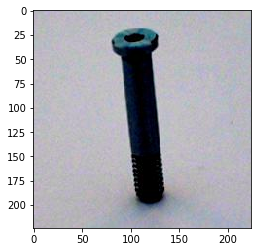

125 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3678_aug_35.jpg
1563.1382209002752


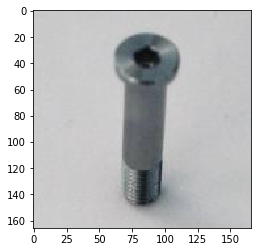

126 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_2.jpg
614.8118495629687


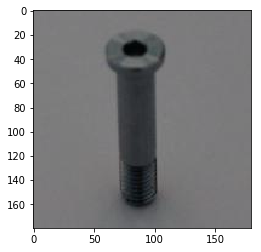

127 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4097_aug_93.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4097_aug_93.jpg
128 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3607_aug_224.jpg
1653.8405112638718


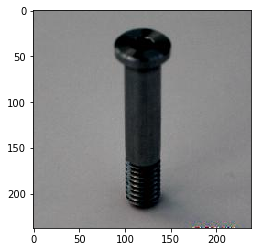

129 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4120_aug_27.jpg
744.7046416528306


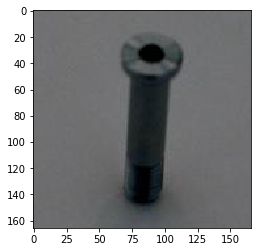

130 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4156_aug_55.jpg
2208.9996732834225


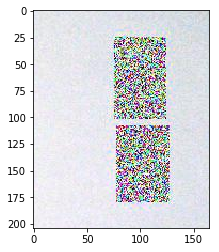

131 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4099_aug_196.jpg
1862.714930017024


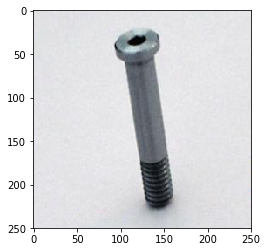

132 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4093_aug_50.jpg
992.6762771888417


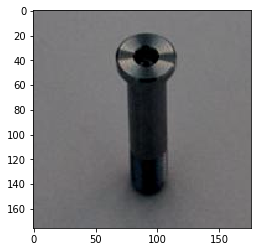

133 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4108_aug_105.jpg
577.5958362643701


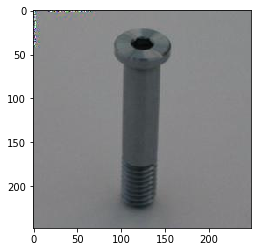

134 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4061_aug_219.jpg
1777.090452899568


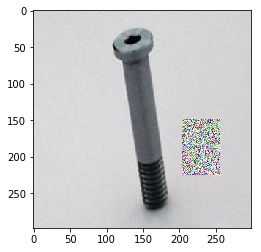

135 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4112_aug_132.jpg
414.1993626465848


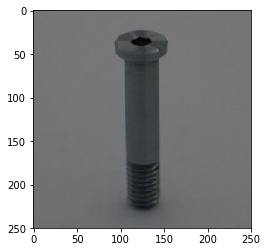

136 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4096_aug_69.jpg
845.8460566707868


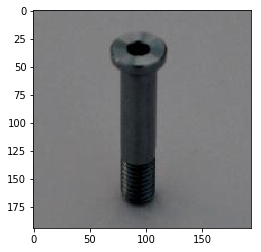

137 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_201.jpg
1101.5207798498116


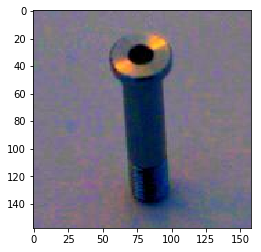

138 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4085_aug_170.jpg
1409.9825686553459


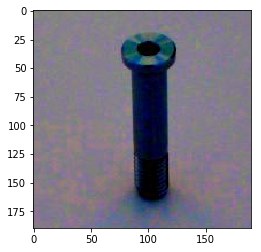

139 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4150_aug_52.jpg
1013.61479835557


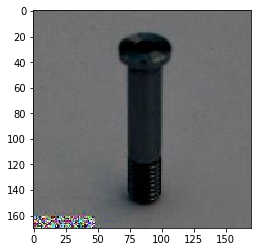

140 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4136_aug_12.jpg
739.6621652423433


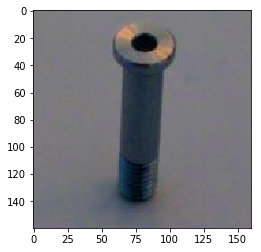

141 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4100_aug_144.jpg
1113.3095507479543


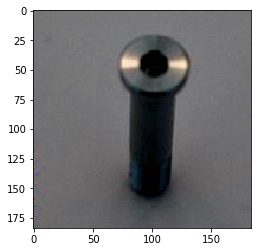

142 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4142_aug_145.jpg
942.9939932682377


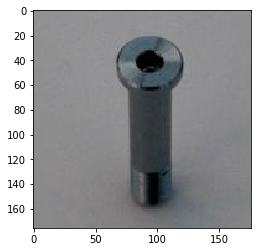

143 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3664_aug_51.jpg
993.9622031550068


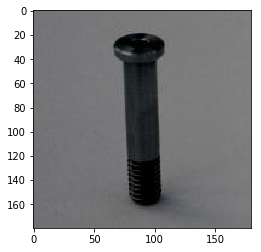

144 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4075_aug_218.jpg
623.6741727701916


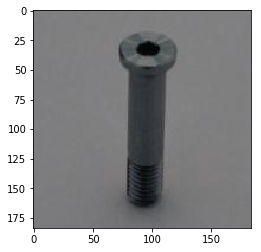

145 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3678_aug_159.jpg
1239.0246355761312


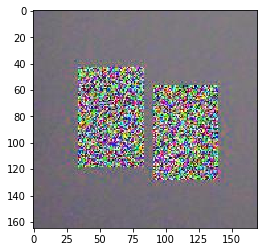

146 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_39.jpg
1859.8728647128632


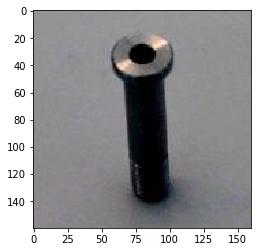

147 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4094_aug_104.jpg
2389.148622444555


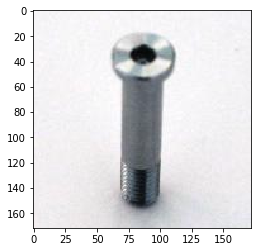

148 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4106_aug_108.jpg
505.4145382235048


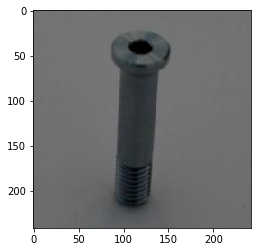

149 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4172_aug_208.jpg
1341.1368893144722


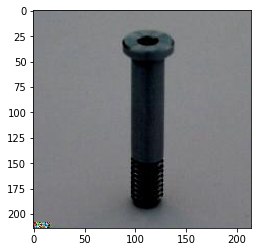

150 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4102_aug_165.jpg
950.4516206885332


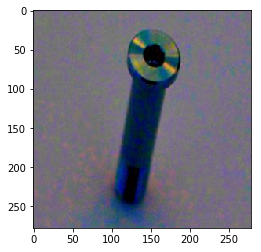

151 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4073_aug_102.jpg
1079.4554545675703


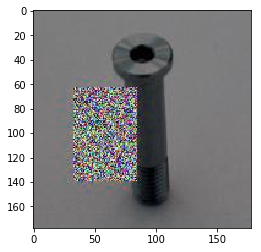

152 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4122_aug_0.jpg
1829.6417484963415


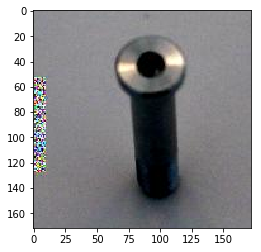

153 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4143_aug_13.jpg
746.6930403493091


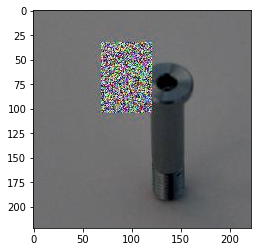

154 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4166_aug_47.jpg
1409.8900457690054


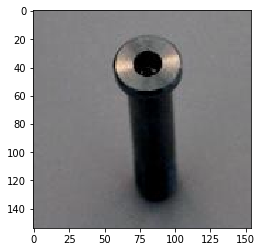

155 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4075_aug_30.jpg
1069.3369861096864


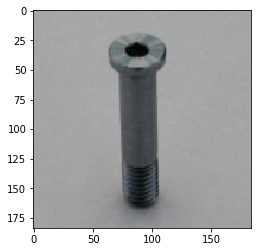

156 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4108_aug_21.jpg
848.3900952193707


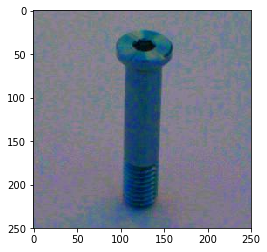

157 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4074_aug_237.jpg
1337.6490403856803


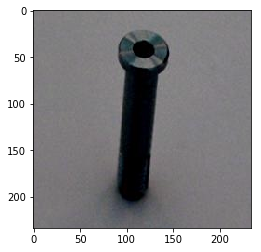

158 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4074_aug_53.jpg
1881.6884852586127


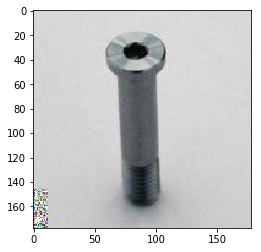

159 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4121_aug_126.jpg
520.2805042959336


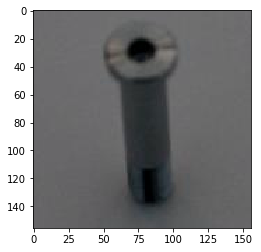

160 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4172_aug_112.jpg
1954.5129011588006


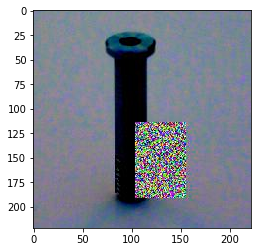

161 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4068_aug_36.jpg
600.6933683956349


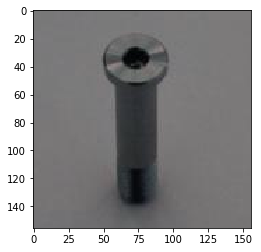

162 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4119_aug_44.jpg
813.0826827950123


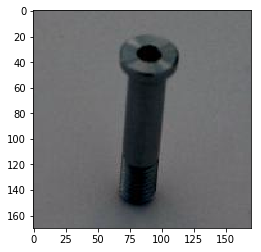

163 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4139_aug_243.jpg
1688.7558394524008


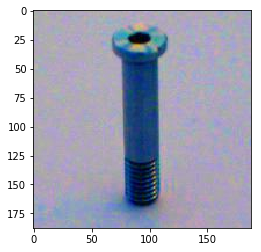

164 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4168_aug_22.jpg
978.5932545024393


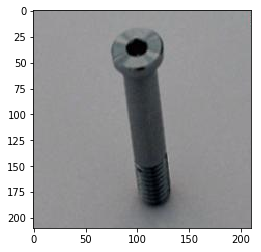

165 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4101_aug_43.jpg
1065.055432245545


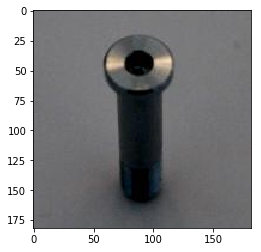

166 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4111_aug_62.jpg
654.299123985626


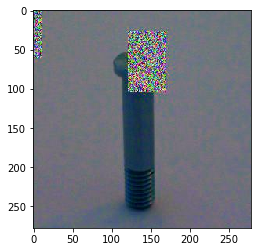

167 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_163.jpg
1219.073535903269


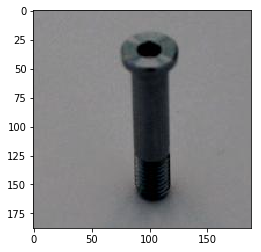

168 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_241.jpg
1090.8913344515383


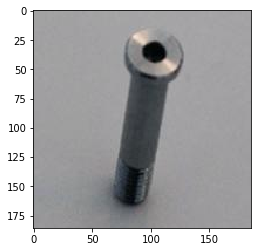

169 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4084_aug_100.jpg
1487.7153478881173


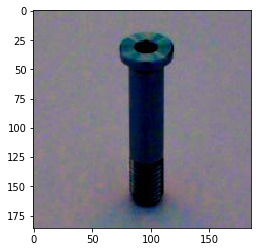

170 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4090_aug_83.jpg
769.7745146923527


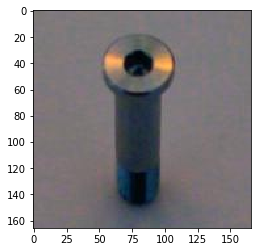

171 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4080_aug_171.jpg
2526.605523244752


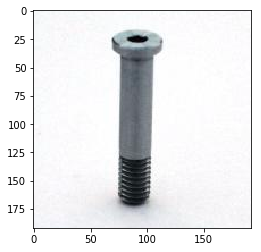

172 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4093_aug_88.jpg
744.8513742562736


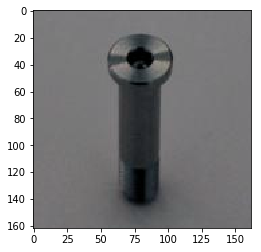

173 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4134_aug_26.jpg
1655.3241013571264


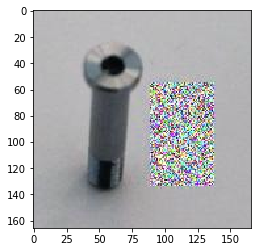

174 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3671_aug_188.jpg
5563.201716215535


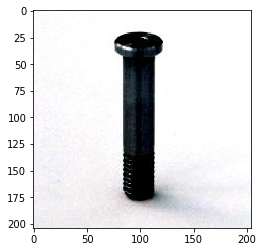

175 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4128_aug_225.jpg
300.3780838390668


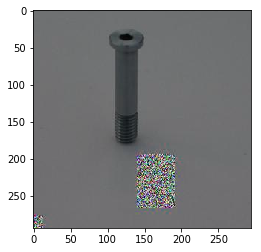

176 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4147_aug_213.jpg
789.2551999255


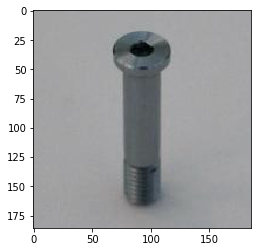

177 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4124_aug_215.jpg
988.9335252910547


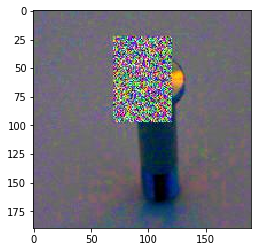

178 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_101.jpg
827.1779589831627


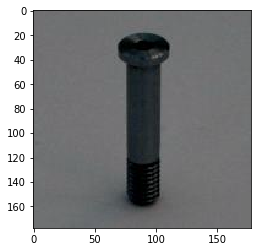

179 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4100_aug_234.jpg
821.5566207944636


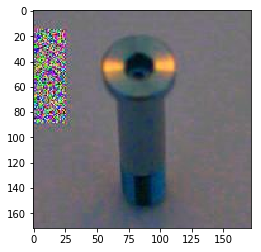

180 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4066_aug_124.jpg
539.2274026679626


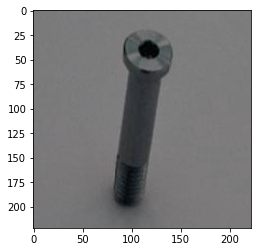

181 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4157_aug_157.jpg
1340.8709470286221


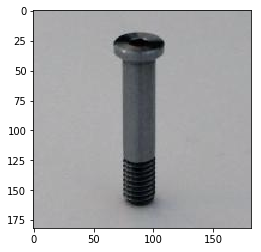

182 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3664_aug_153.jpg
4238.700204454607


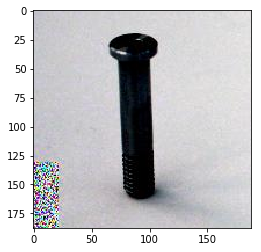

183 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3679_aug_84.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3679_aug_84.jpg
184 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4112_aug_118.jpg
1038.1044350804907


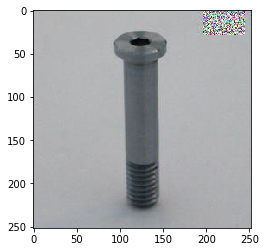

185 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4123_aug_45.jpg
2206.1643038827087


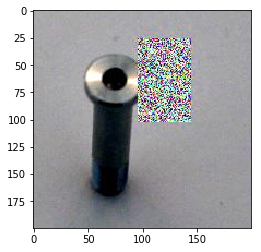

186 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4087_aug_67.jpg
2902.000506358147


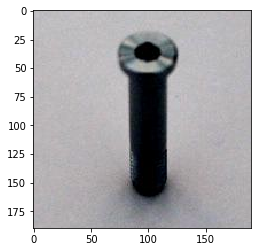

187 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3667_aug_205.jpg
872.4663641609259


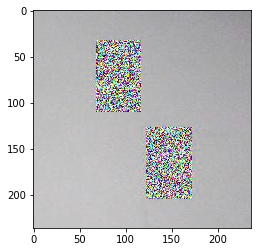

188 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4068_aug_38.jpg
1352.2800084970745


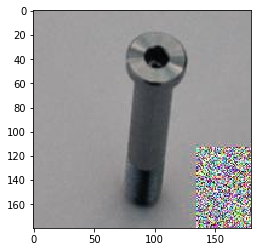

189 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4112_aug_161.jpg
1338.1555504358118


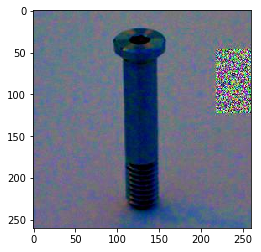

190 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3684_aug_96.jpg
1599.9526830178113


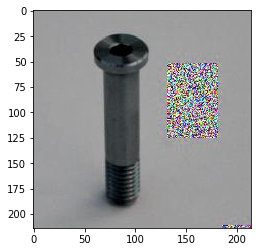

191 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3673_aug_257.jpg
678.1415169519477


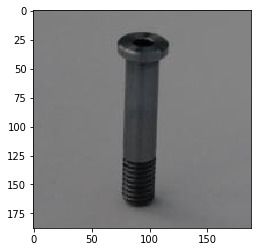

192 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4083_aug_174.jpg
882.3750407342558


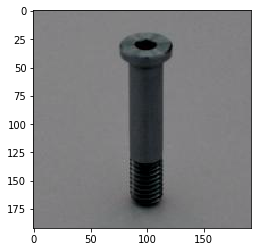

193 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4078_aug_253.jpg
1400.9539189931015


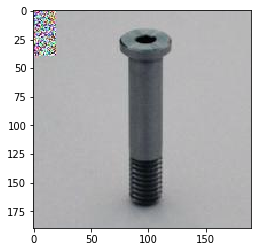

194 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4087_aug_256.jpg
953.6322996016673


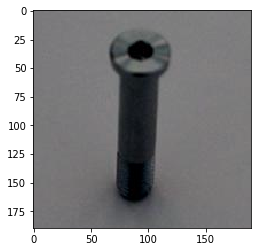

195 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4123_aug_46.jpg
1062.6732491390442


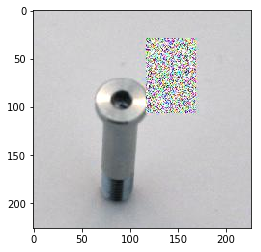

196 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4077_aug_251.jpg
3484.540138109471


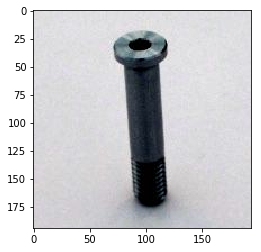

197 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3672_aug_149.jpg
1371.5356626736207


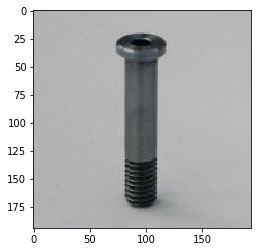

198 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4138_aug_77.jpg
2307.9808638910695


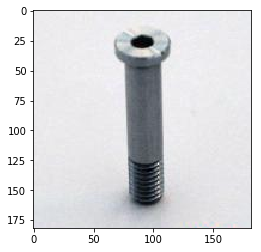

199 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4143_aug_7.jpg
1246.237381786313


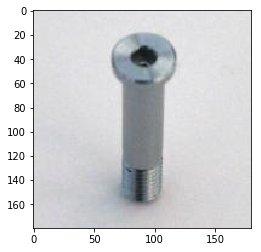

200 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3669_aug_212.jpg
1745.3491471267669


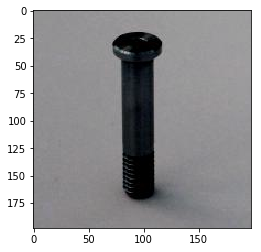

201 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4094_aug_73.jpg
1759.775069909783


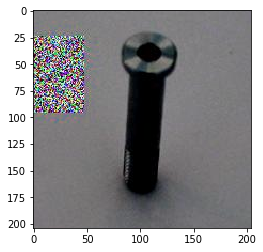

202 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3664_aug_138.jpg
2068.2595176716586


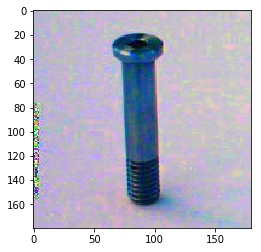

203 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4102_aug_220.jpg
1154.4078024337127


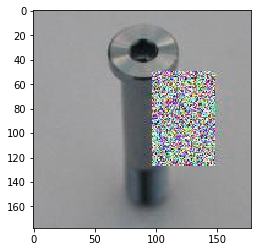

204 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4168_aug_20.jpg
1132.3155738491216


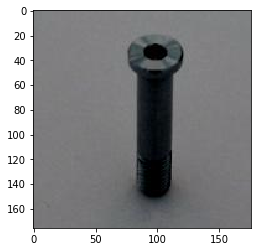

205 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3607_aug_63.jpg
3024.1929674439803


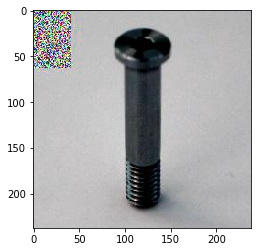

206 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4066_aug_107.jpg
995.1518192213422


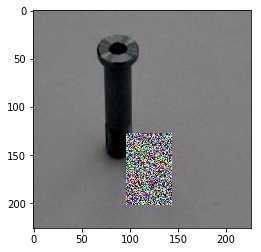

207 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_99.jpg
1082.9090675524094


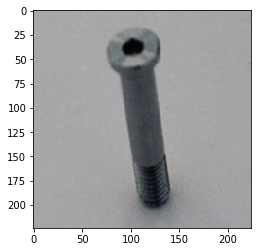

208 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4110_aug_166.jpg
668.0874473491399


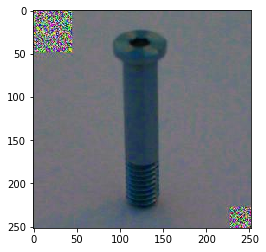

209 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4116_aug_56.jpg
987.3789707025275


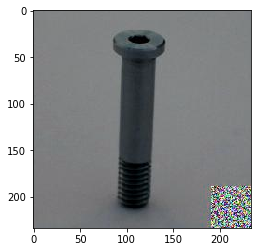

210 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4069_aug_68.jpg
1207.0054589148897


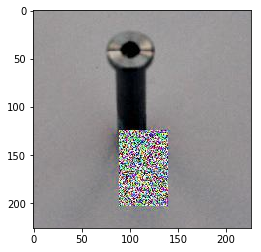

211 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4139_aug_136.jpg
1604.8019845506133


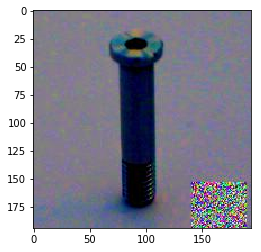

212 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4113_aug_137.jpg
480.23572471061345


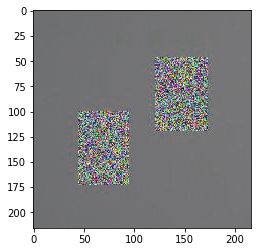

213 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4115_aug_151.jpg
2133.38545739114


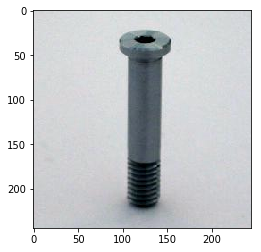

214 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4094_aug_94.jpg
876.9944157642344


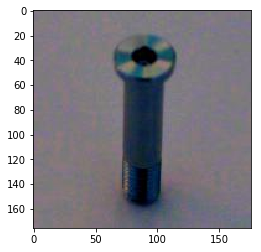

215 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4102_aug_154.jpg
3668.40831403661


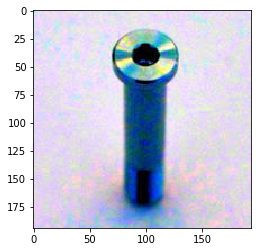

216 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4108_aug_59.jpg
1537.6554160535054


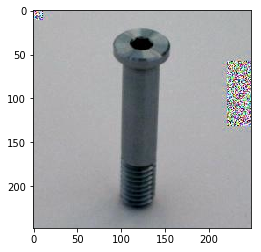

217 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3669_aug_231.jpg
1366.818212355423


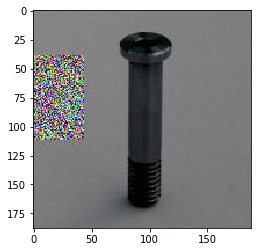

218 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3679_aug_120.jpg
3030.5250942569405


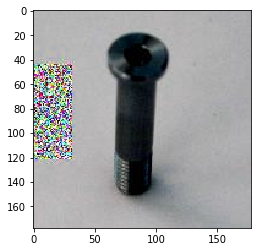

219 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4120_aug_11.jpg
335.98385586851987


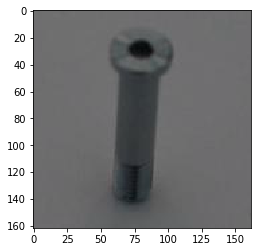

220 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4134_aug_79.jpg
1610.1615329850667


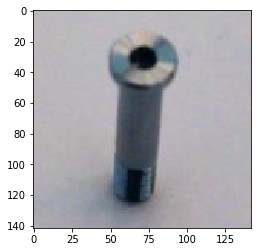

221 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4105_aug_86.jpg
1514.9358584761826


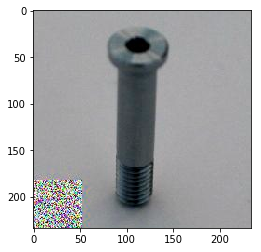

222 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3665_aug_185.jpg
1320.8441485033616


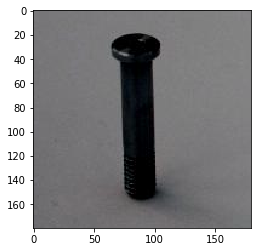

223 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4119_aug_71.jpg
300.256979725352


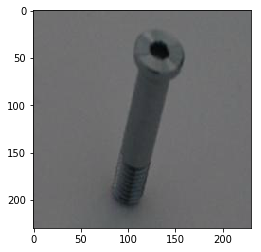

224 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4105_aug_246.jpg
367.6108602667911


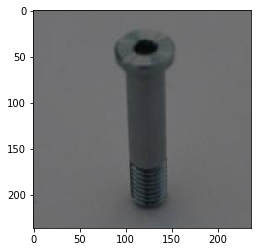

225 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4159_aug_121.jpg
1667.9297205608905


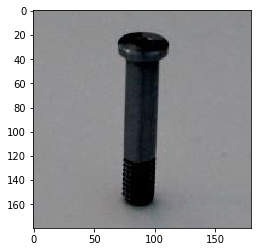

226 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4077_aug_200.jpg
2583.7271510861283


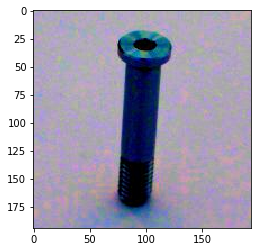

227 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4083_aug_17.jpg
1465.0285639294743


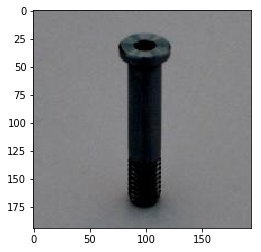

228 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4098_aug_261.jpg
763.2595814292204


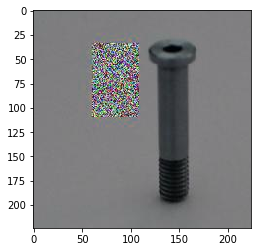

229 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4082_aug_195.jpg
1317.291477275892


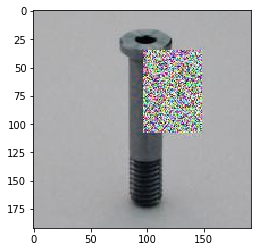

230 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4119_aug_190.jpg
2563.505942348101


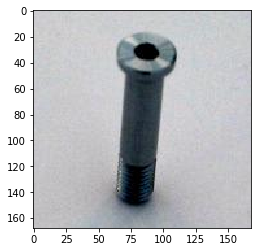

231 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4121_aug_49.jpg
922.6204634465246


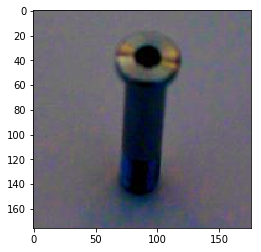

232 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4129_aug_133.jpg
418.8853848125487


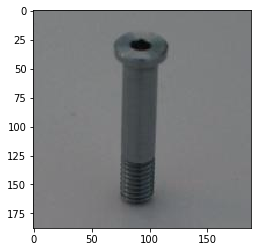

233 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3667_aug_95.jpg
1341.3153150560338


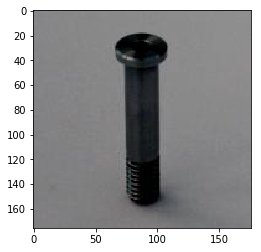

234 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4079_aug_115.jpg
3476.512862395442


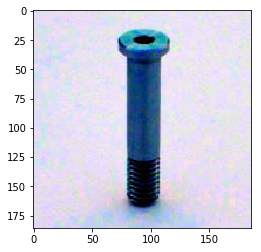

235 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4137_aug_131.jpg
2315.332661660523


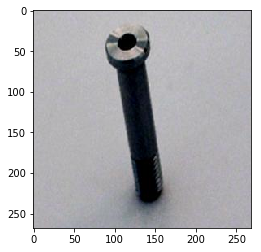

236 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4146_aug_81.jpg
323.9993732719186


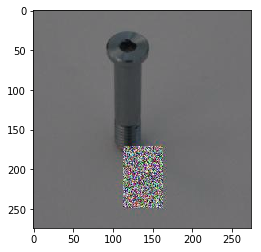

237 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4089_aug_203.jpg
686.2784906460714


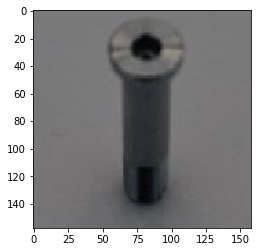

238 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4121_aug_80.jpg
441.661136196028


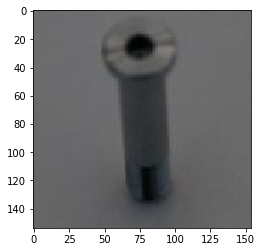

239 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4127_aug_193.jpg
412.2484613811528


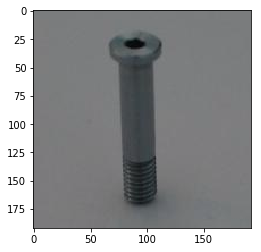

240 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4105_aug_116.jpg
565.326565761621


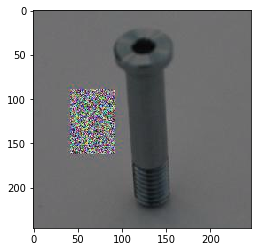

241 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3605_aug_74.jpg
2571.9708147248166


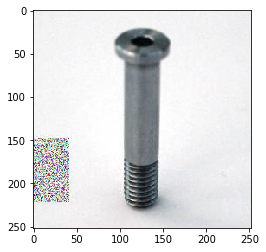

242 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4145_aug_60.jpg
589.8795804301122


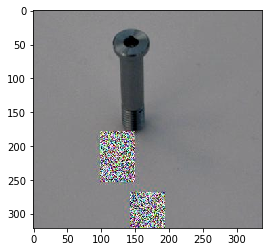

243 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4135_aug_106.jpg
998.1973863999597


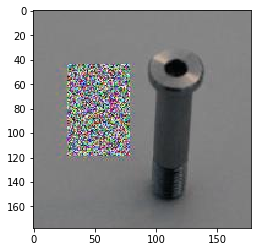

244 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4064_aug_31.jpg
615.7923779274777


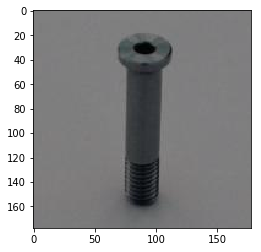

245 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4166_aug_3.jpg
3915.130467444113


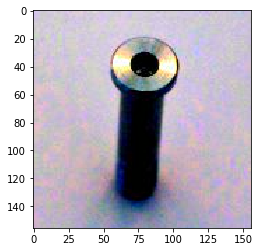

246 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4141_aug_130.jpg
1536.0925085601618


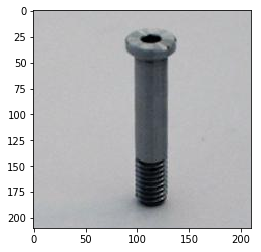

247 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4127_aug_103.jpg
1020.6809440259053


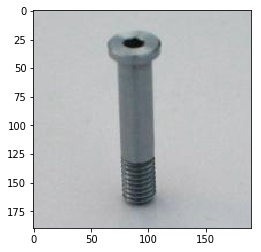

248 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4119_aug_91.jpg
337.231557803226


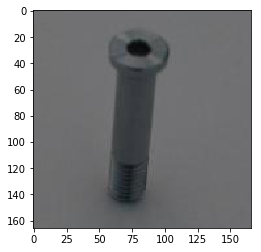

249 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4168_aug_216.jpg
1783.411748764781


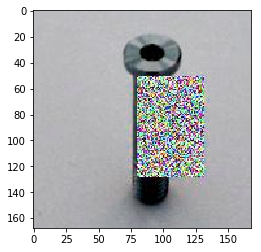

250 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4156_aug_232.jpg
1204.4908851798336


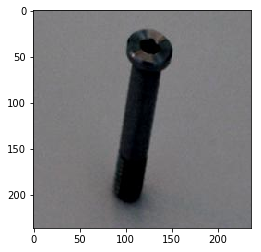

251 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4096_aug_178.jpg
3890.3457049203325


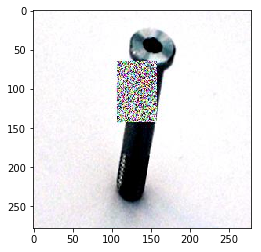

252 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4107_aug_175.jpg
1386.7094195961174


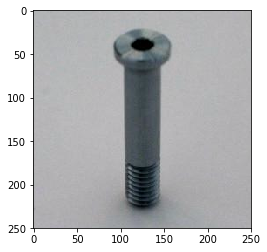

253 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4071_aug_87.jpg
1683.7377630823692


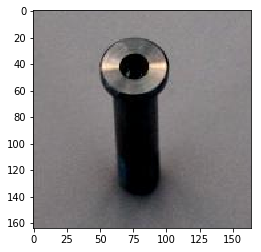

254 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4142_aug_229.jpg
1364.1091793001738


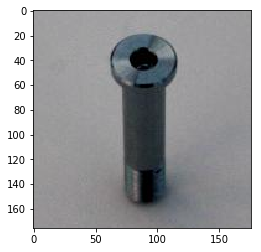

255 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4086_aug_260.jpg
1613.1192653208773


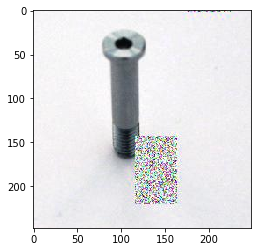

256 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_4.jpg
ERROR:  /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4148_aug_4.jpg
257 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4080_aug_152.jpg
2407.978417894886


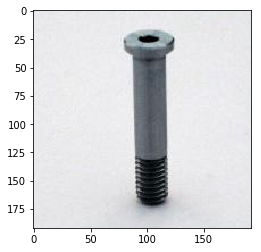

258 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4083_aug_248.jpg
644.3196511542519


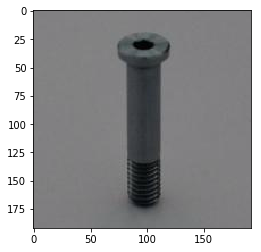

259 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4109_aug_85.jpg
1263.3303735547447


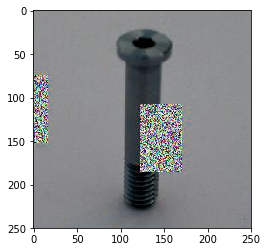

260 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4080_aug_134.jpg
1016.3066136187152


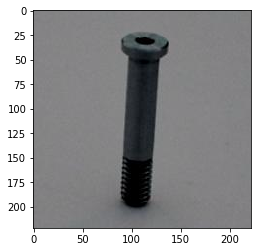

261 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4115_aug_259.jpg
1603.883981053976


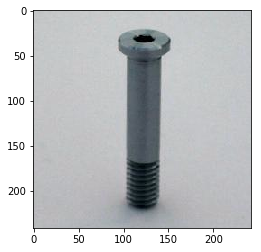

262 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4147_aug_230.jpg
338.434301852128


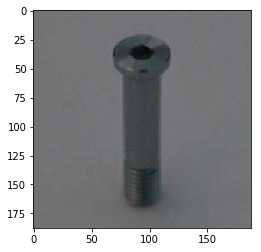

263 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4062_aug_142.jpg
652.3941010857994


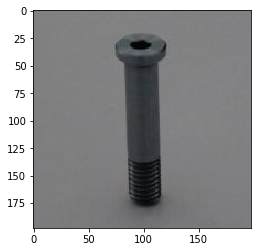

264 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4105_aug_1.jpg
587.7632216295011


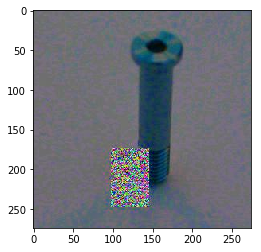

265 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4164_aug_119.jpg
3699.650520028363


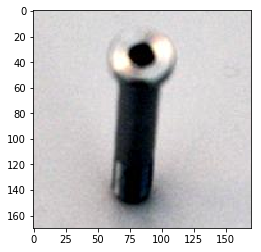

266 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.4171_aug_89.jpg
757.8356426680824


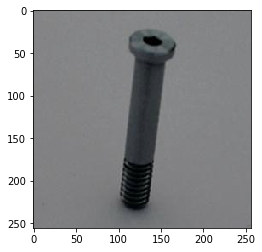

267 /home/jeronimo/git/AUT-CNN-TUB/Data/27072018/aug/2/02.0.2.3.3674_aug_197.jpg
1030.1839385478406


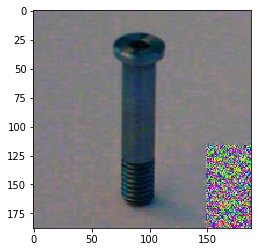

In [110]:
files = get_all_images_from_part(read_path, 2, 'jpg') #jpg
for i, file_path in enumerate(files):
    image = cv2.imread(file_path)
    print(i,file_path)
    try:
        plt.imshow(get_part_from_image(image, scale = 1.1))
        print(get_part_from_image(image, scale = 1.1).var())
        plt.show()
    except:
        print('ERROR: ', file_path)

## genrate folder whith cerndered and well shaped images

In [333]:
new_size = 28

camera = 'canon' # 'canon','industry' 

home = os.getcwd().split('AUT-CNN-TUB')[0]
read_path = os.path.join(home,'AUT-CNN-TUB/Data/Raw_Data_27072018_{}/'.format(camera))
write_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_{}x{}/'.format(camera, new_size, new_size))

extension = 'jpg'
form_factor = imgray.shape[1]/1280

numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])

for part_nr in [x.string for x in numbers if x is not None]:
    for file_path in get_all_images_from_part(read_path, part_nr, extension):
        img_name = file_path.split('/')[-1].replace('.jpg','')
        image = cv2.imread(file_path)

        img_centerd = get_part_from_image(image)
        if img_centerd is not None:
            try:
                img_resized = cv2.resize(img_centerd,(new_size, new_size))
            except:
                print('Image {}.jpg is to small.'.format(img_name))
                img_resized = None
                
            part_patch =os.path.join(write_path, part_nr)
            
            if img_resized is not None:
                if img_resized.var() > 500 * form_factor:
                    if os.path.exists(part_patch):
                        cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)
                    else:
                        os.makedirs(part_patch)
                        cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)
                else:
                    print('Image {}.jpg does not have the necessary variance.'.format(img_name))


Image 02.0.2.3.4151.jpg is to small.
Image 14.0.2.3.3374.jpg is to small.
Image 14.0.2.3.3398.jpg is to small.
Image 14.0.2.3.5199.jpg is to small.
Image 14.0.2.3.5130.jpg is to small.
Image 14.0.2.3.3403.jpg is to small.
Image 14.0.2.3.3391.jpg is to small.
Image 14.0.2.3.5159.jpg is to small.
Image 14.0.2.3.3382.jpg is to small.
Image 14.0.2.3.3402.jpg is to small.
Image 14.0.2.3.3413.jpg is to small.
Image 14.0.2.3.3387.jpg is to small.
Image 14.0.2.3.5147.jpg is to small.
Image 14.0.2.3.3379.jpg is to small.
Image 14.0.2.3.3363.jpg is to small.
Image 14.0.2.3.3362.jpg is to small.
Image 01.0.2.3.3589.jpg is to small.
Image 01.0.2.3.4050.jpg is to small.
Image 01.0.2.3.4051.jpg is to small.
Image 01.0.2.3.3947.jpg is to small.
Image 01.0.2.3.3592.jpg is to small.
Image 01.0.2.3.3552.jpg is to small.
Image 01.0.2.3.4036.jpg is to small.
Image 01.0.2.3.3591.jpg is to small.
Image 01.0.2.3.3948.jpg is to small.
Image 01.0.2.3.3590.jpg is to small.
Image 07.1.2.3.3857.jpg does not have 

### downscale

In [232]:
new_size = 100

home = os.getcwd().split('AUT-CNN-TUB')[0]
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_200x200/'.format(camera))
write_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_{}x{}/'.format(camera, new_size, new_size))

extension = 'jpg'

numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
for part_nr in [x.string for x in numbers if x is not None]:
    for file_path in get_all_images_from_part(read_path, part_nr, extension):
        img_name = file_path.split('/')[-1].replace('.jpg','')
        image = cv2.imread(file_path)

        try:
            img_resized = cv2.resize(image,(new_size, new_size))
        except:
            print('Image {}.jpg is to small.'.format(img_name))
        
        part_patch =os.path.join(write_path, part_nr)
            
        if os.path.exists(part_patch):
            cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)
        else:
            os.makedirs(part_patch)
            cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)

In [233]:
new_size = 50

home = os.getcwd().split('AUT-CNN-TUB')[0]
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_200x200/'.format(camera))
write_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_{}x{}/'.format(camera, new_size, new_size))

extension = 'jpg'

numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
for part_nr in [x.string for x in numbers if x is not None]:
    for file_path in get_all_images_from_part(read_path, part_nr, extension):
        img_name = file_path.split('/')[-1].replace('.jpg','')
        image = cv2.imread(file_path)

        try:
            img_resized = cv2.resize(image,(new_size, new_size))
        except:
            print('Image {}.jpg is to small.'.format(img_name))
        
        part_patch =os.path.join(write_path, part_nr)
            
        if os.path.exists(part_patch):
            cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)
        else:
            os.makedirs(part_patch)
            cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)

In [234]:
new_size = 28

home = os.getcwd().split('AUT-CNN-TUB')[0]
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_200x200/'.format(camera))
write_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_{}x{}/'.format(camera, new_size, new_size))

extension = 'jpg'

numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
for part_nr in [x.string for x in numbers if x is not None]:
    for file_path in get_all_images_from_part(read_path, part_nr, extension):
        img_name = file_path.split('/')[-1].replace('.jpg','')
        image = cv2.imread(file_path)

        try:
            img_resized = cv2.resize(image,(new_size, new_size))
        except:
            print('Image {}.jpg is to small.'.format(img_name))
        
        part_patch =os.path.join(write_path, part_nr)
            
        if os.path.exists(part_patch):
            cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)
        else:
            os.makedirs(part_patch)
            cv2.imwrite(os.path.join(part_patch, '{}.{}'.format(img_name, extension)), img_resized)

### summarize

In [175]:
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_200x200/'.format(camera))
numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
print('Images in File:')
for part_nr in [x.string for x in numbers if x is not None]:
    print('{}\t{}'.format(len(os.listdir(os.path.join(read_path, part_nr))), part_nr))


Images in File:
1060	2
1029	13
1022	14
1160	1
1074	7.1
1271	8
1231	5
970	4
1072	3
1047	10
999	12
1149	11
773	6
916	7.2
1052	15
945	9


In [176]:
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}/'.format(camera))
numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
print('Images in File:')
for part_nr in [x.string for x in numbers if x is not None]:
    print('{}\t{}'.format(len(os.listdir(os.path.join(read_path, part_nr))), part_nr))


Images in File:
1097	2
1075	13
1117	14
1160	1
1079	7.1
1272	8
1234	5
970	4
1072	3
1047	10
1150	12
1161	11
832	6
1257	7.2
1059	15
948	9


In [330]:
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}/'.format(camera))
numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])

read_path1 = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_200x200_alt/'.format(camera))
print('Images in File:')
for part_nr in [x.string for x in numbers if x is not None]:
    print('{}\t{}'.format(((len(os.listdir(os.path.join(read_path, part_nr)))-len(os.listdir(os.path.join(read_path1, part_nr))))/len(os.listdir(os.path.join(read_path, part_nr)))), part_nr))


Images in File:
0.03372835004557885	2
0.04279069767441861	13
0.08504923903312445	14
0.0	1
0.004633920296570899	7.1
0.0007861635220125787	8
0.0024311183144246355	5
0.0	4
0.0	3
0.0	10
0.13130434782608696	12
0.0103359173126615	11
0.07091346153846154	6
0.27128082736674625	7.2
0.0066100094428706326	15
0.0031645569620253164	9


In [366]:
imgray.var()

567.4812777415752

In [367]:
imgray.shape

(480, 720)

In [371]:
cv2.resize(imgray,(int(480/10), int(720/10))).var()


560.748794367284

In [364]:
read_path = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}/'.format(camera))
numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])

read_path1 = os.path.join(home,'AUT-CNN-TUB/Data/27072018/27072018_{}_centered_200x200/'.format(camera))
print('Images in File:')
for part_nr in [x.string for x in numbers if x is not None]:
    print('{}\t{}'.format(((len(os.listdir(os.path.join(read_path, part_nr)))-len(os.listdir(os.path.join(read_path1, part_nr))))/len(os.listdir(os.path.join(read_path, part_nr)))), part_nr))


Images in File:
0.005319148936170213	2
0.0	13
0.10112359550561797	14
0.049019607843137254	1
0.03546099290780142	7.1
0.0	8
0.06504065040650407	5
0.025	4
0.016129032258064516	3
0.0	10
0.0	12
0.0	11
0.19718309859154928	6
0.008130081300813009	7.2
0.0	15
0.013333333333333334	9


In [ ]:
size = 28
read_path = os.path.join(home,'AUT-CNN-TUB/Data/Raw_Data_27072018_{}_centered_{}x{}'.format(camera,size, size))
path_length   = len(read_path) 

test_path  = os.path.join(home,'AUT-CNN-TUB/Data/TF_Images_merge_{}/test/'.format(size, size))
validate_path  = os.path.join(home,'AUT-CNN-TUB/Data/TF_Images_merge_{}/validate/'.format(size, size))
train_path = os.path.join(home,'AUT-CNN-TUB/Data/TF_Images_merge_{}/train/'.format(size, size))

ratio = 0.7 #train
# test = 0.2
# validate = 0.1
img_path = read_path
GRBtoGray = False
extension = 'jpg'


numbers = filter(None, [re.match('\d+',f) for f in  os.listdir(read_path)])
for part_nr in [x.string for x in numbers if x is not None]:
    
    files = get_all_images_from_part(read_path, part_nr, extension)            
    num_imag = len(files)
    breakpoint = int(np.round(ratio * num_imag)) 
    Data = np.arange(0, num_imag)            
    random.shuffle(Data)  
    DataTrain = Data[:int(np.round(ratio * num_imag)) ]              
    DataTest = Data[int(np.round(ratio * num_imag)) : int(np.round(0.2 * num_imag))]         
    DataVal  = Data[int(np.round(0.9 * num_imag)) : ]         
    
    if os.path.exists(test_path) is False:
        os.makedirs(test_path)
        
    if os.path.exists(train_path) is False:
        os.makedirs(train_path)
    
    for i,f1 in enumerate(files):
        img_name = f1.split('/')[-1]        

        img = cv2.imread(f1)
        if(GRBtoGray == True):
                img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)      


        if(i in DataTrain):
            cv2.imwrite(train_path + img_name, img)  
        if(i in DataTest):
            cv2.imwrite(test_path + img_name, img) 
        if(i in DataVal):
            cv2.imwrite(test_path + img_name, img)  

### save zip on S3

In [ ]:
import boto3
import botocore

s3 = boto3.resource('s3')
bucket = s3.Bucket('imagesforcnn')

for bucket in s3.buckets.all():
    print(bucket.name)
        
for object in s3.Bucket('imagesforcnn').objects.all():
    print(object)

In [ ]:
# zip dir 
from_dir = os.path.join(home,'AUT-CNN-TUB/Data/Centered/')
to_dir = os.path.join(home,'AUT-CNN-TUB/Data/Centered')

shutil.make_archive(to_dir,
                    'zip',
                    from_dir
                    )

In [ ]:

path = os.path.join(home,'AUT-CNN-TUB/Data/')

from_dir = os.path.join(home,'AUT-CNN-TUB/Data/Centered')
to_dir = os.path.join(home,'AUT-CNN-TUB/Data/')
filename = 'Centered'

extension = 'zip'

if extension is 'zip':
    shutil.make_archive(os.path.join(os.path.join(to_dir, filename)), extension, from_dir)

# Upload a new file
data = open(os.path.join(to_dir, filename + '.{}'.format(extension)), 'rb')
print('uploading {}.{} ... '.format(filename, extension), end='\r')
bucket.put_object(Key=filename + '.{}'.format(extension), Body=data)
print('uploading {}.{} finished'.format(filename, extension))
